# Code Starts Here

In [32]:
using Plots, CSV, DataFrames, GLM, Statistics
using StatsPlots
using BSON
using LaTeXStrings
using Colors, ColorSchemes
using Measures
using Dates
using StatsBase
using LinearAlgebra
#using RCall
#R"library(tvReg)"
#R"library(forecast)"

In [33]:
mycolor=[colorant"rgb(222,102,62)",colorant"rgb(255,145,43)",colorant"rgb(76,144,186)",colorant"rgb(43,194,194)",colorant"rgb(244,184,17)"]

### Color definitions

In [35]:
function ratio(fordat,t1,t2,loss,lev)
    
    benchmark=1
    
    #minv=abs.(minimum([minimum(fordat[j]) for j=1:size(fordat)[1]])).+0.02
    minv0=[minimum(fordat[j]) for j=1:size(fordat)[1]]
    minv=abs.(minv0).+0.02
    
    if loss == "RMSE"
        rat=Float64.(hcat([[sqrt(mean((trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev)).^2))/sqrt(mean((trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,benchmark+1],prop=lev)).^2)) for j=1:size(fordat)[1]] for k=2:6]...)')
        rat=rat[Not(benchmark),:];
    elseif loss == "MAE"
        rat=Float64.(hcat([[mean(abs.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev)))/mean(abs.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,benchmark+1],prop=lev))) for j=1:size(fordat)[1]] for k=2:6]...)')
        rat=rat[Not(benchmark),:];
    elseif loss == "MAE-LOG"
        rat=Float64.(hcat([[mean(abs.(log.(fordat[j][t1:t2,1].+minv[j]).-log.(fordat[j][t1:t2,k].+minv[j])))/mean(abs.(log.(fordat[j][t1:t2,1].+minv[j]).-log.(fordat[j][t1:t2,benchmark+1].+minv[j]))) for j=1:size(fordat)[1]] for k=2:6]...)')
        rat=rat[Not(benchmark),:];
    elseif loss == "QLIKE"
        rat=Float64.(hcat([[mean(log.(fordat[j][t1:t2,k].+minv[j]).+(fordat[j][t1:t2,1].+minv[j])./(fordat[j][t1:t2,k].+minv[j]))/mean(log.(fordat[j][t1:t2,benchmark+1].+minv[j]).+(fordat[j][t1:t2,1].+minv[j])./(fordat[j][t1:t2,benchmark+1].+minv[j])) for j=1:size(fordat)[1]] for k=2:6]...)')
        rat=rat[Not(benchmark),:];
    elseif loss == "MZa"
        rat0=[]
        for j=1:size(fordat)[1]
            s=[]
            for k=2:6
                trimmed=Float64.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev))
                pos2=[findall(x->x==trimmed[n],(fordat[j][t1:t2,1].-fordat[j][t1:t2,k]))[1] for n=1:length(trimmed)];
                dataD = DataFrame(Y=fordat[j][t1:t2,1][pos2], X=fordat[j][t1:t2,k][pos2])
                MZols = lm(@formula(Y ~ X), dataD)
                push!(s,coeftable(MZols).cols[1][1])
            end
            push!(rat0,s)
        end
        rat=hcat(rat0...)
    elseif loss == "MZb"
        rat0=[]
        for j=1:size(fordat)[1]
            s=[]
            for k=2:6
                trimmed=Float64.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev))
                pos2=[findall(x->x==trimmed[n],(fordat[j][t1:t2,1].-fordat[j][t1:t2,k]))[1] for n=1:length(trimmed)];
                dataD = DataFrame(Y=fordat[j][t1:t2,1][pos2], X=fordat[j][t1:t2,k][pos2])
                MZols = lm(@formula(Y ~ X), dataD)
                push!(s,coeftable(MZols).cols[1][2])
            end
            push!(rat0,s)
        end
        rat=hcat(rat0...)
    elseif loss == "MZR2"
        rat0=[]
        for j=1:size(fordat)[1]
            s=[]
            for k=2:6
                
                trimmed=Float64.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev))
                pos2=[findall(x->x==trimmed[n],(fordat[j][t1:t2,1].-fordat[j][t1:t2,k]))[1] for n=1:length(trimmed)];
                dataD = DataFrame(Y=fordat[j][t1:t2,1][pos2], X=fordat[j][t1:t2,k][pos2])
                MZols = lm(@formula(Y ~ X), dataD)
                push!(s,r2(MZols))
            end
            push!(rat0,s)
        end
        rat=hcat(rat0...)
    
    elseif loss == "MZR2ratio"
        rat0=[]
        for j=1:size(fordat)[1]
            s=[]
            dataD = DataFrame(Y=fordat[j][t1:t2,1], X=fordat[j][t1:t2,benchmark+1])
            MZols0 = lm(@formula(Y ~ X), dataD)
            for k=2:6
                trimmed=Float64.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev))
                pos2=[findall(x->x==trimmed[n],(fordat[j][t1:t2,1].-fordat[j][t1:t2,k]))[1] for n=1:length(trimmed)];
                dataD = DataFrame(Y=fordat[j][t1:t2,1][pos2], X=fordat[j][t1:t2,k][pos2])
                MZols = lm(@formula(Y ~ X), dataD)
                push!(s,r2(MZols)/r2(MZols0))
            end
            push!(rat0,s)
        end
        rat=hcat(rat0...)
        rat=rat[Not(benchmark),:];
    end

    return rat
end

#### here, you can choose how many models you compare ######

function ratio2(fordat,t1,t2,loss,lev,num)
    
    benchmark=1
    
    #minv=abs.(minimum([minimum(fordat[j]) for j=1:size(fordat)[1]])).+0.02
    minv0=[minimum(fordat[j]) for j=1:size(fordat)[1]]
    minv=abs.(minv0).+0.02
    
    if loss == "RMSE"
        rat=Float64.(hcat([[sqrt(mean((trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev)).^2))/sqrt(mean((trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,benchmark+1],prop=lev)).^2)) for j=1:size(fordat)[1]] for k=2:num]...)')
        rat=rat[Not(benchmark),:];
    elseif loss == "MAE"
        rat=Float64.(hcat([[mean(abs.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev)))/mean(abs.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,benchmark+1],prop=lev))) for j=1:size(fordat)[1]] for k=2:num]...)')
        rat=rat[Not(benchmark),:];
    elseif loss == "MAE-LOG"
        rat=Float64.(hcat([[mean(abs.(log.(fordat[j][t1:t2,1].+minv[j]).-log.(fordat[j][t1:t2,k].+minv[j])))/mean(abs.(log.(fordat[j][t1:t2,1].+minv[j]).-log.(fordat[j][t1:t2,benchmark+1].+minv[j]))) for j=1:size(fordat)[1]] for k=2:num]...)')
        rat=rat[Not(benchmark),:];
    elseif loss == "QLIKE"
        rat=Float64.(hcat([[mean(log.(fordat[j][t1:t2,k].+minv[j]).+(fordat[j][t1:t2,1].+minv[j])./(fordat[j][t1:t2,k].+minv[j]))/mean(log.(fordat[j][t1:t2,benchmark+1].+minv[j]).+(fordat[j][t1:t2,1].+minv[j])./(fordat[j][t1:t2,benchmark+1].+minv[j])) for j=1:size(fordat)[1]] for k=2:num]...)')
        rat=rat[Not(benchmark),:];
    elseif loss == "MZa"
        rat0=[]
        for j=1:size(fordat)[1]
            s=[]
            for k=2:num
                trimmed=Float64.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev))
                pos2=[findall(x->x==trimmed[n],(fordat[j][t1:t2,1].-fordat[j][t1:t2,k]))[1] for n=1:length(trimmed)];
                dataD = DataFrame(Y=fordat[j][t1:t2,1][pos2], X=fordat[j][t1:t2,k][pos2])
                MZols = lm(@formula(Y ~ X), dataD)
                push!(s,coeftable(MZols).cols[1][1])
            end
            push!(rat0,s)
        end
        rat=hcat(rat0...)
    elseif loss == "MZb"
        rat0=[]
        for j=1:size(fordat)[1]
            s=[]
            for k=2:num
                trimmed=Float64.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev))
                pos2=[findall(x->x==trimmed[n],(fordat[j][t1:t2,1].-fordat[j][t1:t2,k]))[1] for n=1:length(trimmed)];
                dataD = DataFrame(Y=fordat[j][t1:t2,1][pos2], X=fordat[j][t1:t2,k][pos2])
                MZols = lm(@formula(Y ~ X), dataD)
                push!(s,coeftable(MZols).cols[1][2])
            end
            push!(rat0,s)
        end
        rat=hcat(rat0...)
    elseif loss == "MZR2"
        rat0=[]
        for j=1:size(fordat)[1]
            s=[]
            for k=2:num
                
                trimmed=Float64.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev))
                pos2=[findall(x->x==trimmed[n],(fordat[j][t1:t2,1].-fordat[j][t1:t2,k]))[1] for n=1:length(trimmed)];
                dataD = DataFrame(Y=fordat[j][t1:t2,1][pos2], X=fordat[j][t1:t2,k][pos2])
                MZols = lm(@formula(Y ~ X), dataD)
                push!(s,r2(MZols))
            end
            push!(rat0,s)
        end
        rat=hcat(rat0...)
    
    elseif loss == "MZR2ratio"
        rat0=[]
        for j=1:size(fordat)[1]
            s=[]
            dataD = DataFrame(Y=fordat[j][t1:t2,1], X=fordat[j][t1:t2,benchmark+1])
            MZols0 = lm(@formula(Y ~ X), dataD)
            for k=2:num
                trimmed=Float64.(trim(fordat[j][t1:t2,1].-fordat[j][t1:t2,k],prop=lev))
                pos2=[findall(x->x==trimmed[n],(fordat[j][t1:t2,1].-fordat[j][t1:t2,k]))[1] for n=1:length(trimmed)];
                dataD = DataFrame(Y=fordat[j][t1:t2,1][pos2], X=fordat[j][t1:t2,k][pos2])
                MZols = lm(@formula(Y ~ X), dataD)
                push!(s,r2(MZols)/r2(MZols0))
            end
            push!(rat0,s)
        end
        rat=hcat(rat0...)
        rat=rat[Not(benchmark),:];
    end

    return rat
end


function get_loss(for1,for5,for22,sel,loss,lev1,lev5,lev22)
    
    results1=[]
    results5=[]
    results22=[]
    for k=1:3

        t1=sel[1,k]
        t2=sel[2,k] # fullsample

        resultsexp1=ratio(for1,t1,t2,loss,lev1)
        pos=findall(x->x==1,isnan.(resultsexp1))
        resultsexp1=resultsexp1[:,Not([pos[k][2] for k=1:length(pos)])]

        resultsexp5=ratio(for5,t1,t2-5,loss,lev5)
        pos=findall(x->x==1,isnan.(resultsexp5))
        resultsexp5=resultsexp5[:,Not([pos[k][2] for k=1:length(pos)])]

        resultsexp22=ratio(for22,t1,t2-22,loss,lev22)
        pos=findall(x->x==1,isnan.(resultsexp22))
        resultsexp22=resultsexp22[:,Not([pos[k][2] for k=1:length(pos)])]
        resultsexp22=resultsexp22[:,Not(findall(x->x>3,resultsexp22[3,:]))]
        resultsexp22=resultsexp22[:,Not(findall(x->x>3,resultsexp22[2,:]))]

        push!(results1,resultsexp1)
        push!(results5,resultsexp5)
        push!(results22,resultsexp22)
    end
    return (results1,results5,results22)

end

function get_loss2(for1,for5,for22,sel,loss,lev1,lev5,lev22,num)
    
    results1=[]
    results5=[]
    results22=[]
    for k=1:3

        t1=sel[1,k]
        t2=sel[2,k] # fullsample

        resultsexp1=ratio2(for1,t1,t2,loss,lev1,num)
        pos=findall(x->x==1,isnan.(resultsexp1))
        resultsexp1=resultsexp1[:,Not([pos[k][2] for k=1:length(pos)])]

        resultsexp5=ratio2(for5,t1,t2-5,loss,lev5,num)
        pos=findall(x->x==1,isnan.(resultsexp5))
        resultsexp5=resultsexp5[:,Not([pos[k][2] for k=1:length(pos)])]

        resultsexp22=ratio2(for22,t1,t2-22,loss,lev22,num)
        pos=findall(x->x==1,isnan.(resultsexp22))
        resultsexp22=resultsexp22[:,Not([pos[k][2] for k=1:length(pos)])]
        resultsexp22=resultsexp22[:,Not(findall(x->x>3,resultsexp22[4,:]))]
        resultsexp22=resultsexp22[:,Not(findall(x->x>3,resultsexp22[3,:]))]
        #resultsexp22=resultsexp22[:,Not(findall(x->x>3,resultsexp22[1,:]))]

        push!(results1,resultsexp1)
        push!(results5,resultsexp5)
        push!(results22,resultsexp22)
    end
    return (results1,results5,results22)

end

function multiple_boxplot(dat1,dat5,dat22,y1,y2,ylab,legendlab)
    
    h1=DataFrame([vec(dat1) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat1')[2])) repeat([1], length(vec(dat1')))], ["ratio", "model", "horz"])
    h5=DataFrame([vec(dat5) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat5')[2])) repeat([5], length(vec(dat5')))], ["ratio", "model", "horz"])
    h22=DataFrame([vec(dat22) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat22')[2])) repeat([22], length(vec(dat22')))], ["ratio", "model", "horz"])
    
    df = [h1; h5; h22]

    h10=DataFrame([vec(repeat(median(dat1,dims=1), size(dat1')[2])) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat1')[2])) repeat([1], length(vec(dat1')))], ["medians", "model", "horz"])
    h50=DataFrame([vec(repeat(median(dat5,dims=1), size(dat5')[2])) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat5')[2])) repeat([5], length(vec(dat5')))], ["medians", "model", "horz"])
    h220=DataFrame([vec(repeat(median(dat22,dims=1), size(dat22')[2])) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat22')[2])) repeat([22], length(vec(dat22')))], ["medians", "model", "horz"])
    
    df1 = [h10; h50; h220]
    
    mycolors=[mycolor[5] mycolor[1] mycolor[3]];

    p=groupeddotplot(df.model, df.ratio, group = df.horz, label="", bar_width=0.6,markershape=:circle,markersize=1.2,markeralpha=0.3,
            markercolor=mycolors,markerstrokecolor=:white,framestyle=:box,ylim=[y1,y2],size=(250,400),title=ylab)
    p=groupedboxplot!(df.model, df.ratio, group = df.horz, label=legendlab,linecolor=mycolors,color=mycolors, fillalpha=0.6,
        bar_width=0.6,outliers=false,whisker_width=0.2,linewidth=0.5,linealpha = 0.3)
    p=groupedboxplot!(df1.model, df1.medians, group = df1.horz, bar_width=0.6,linecolor=:White,color=:black,linewidth=2,label="",)
    p=hline!(p,[1],label="",color=:black)
    p=plot!(fontfamily="serif-roman",titlefontsize=10, xtickfontsize=10,ytickfontsize=10,ylabelfontsize=10) 
    return p
end

function multiple_boxplot_pockets(dat1,dat5,dat22,dat1pockets,y1,y2,ylab,legendlab)

    h1=DataFrame([vec(dat1) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat1')[2])) repeat([1], length(vec(dat1')))], ["ratio", "model", "horz"])
    h5=DataFrame([vec(dat5) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat5')[2])) repeat([5], length(vec(dat5')))], ["ratio", "model", "horz"])
    h22=DataFrame([vec(dat22) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat22')[2])) repeat([22], length(vec(dat22')))], ["ratio", "model", "horz"])

    h1pockets=DataFrame([vec(dat1pockets) vec(repeat(["TV-AR" "TV-HAR" "TV-EWD"], size(dat1pockets')[2])) repeat([23], length(vec(dat1pockets')))], ["ratio", "model", "horz"])

    df = [h1; h5; h22; h1pockets]

    h10=DataFrame([vec(repeat(median(dat1,dims=1), size(dat1')[2])) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat1')[2])) repeat([1], length(vec(dat1')))], ["medians", "model", "horz"])
    h50=DataFrame([vec(repeat(median(dat5,dims=1), size(dat5')[2])) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat5')[2])) repeat([5], length(vec(dat5')))], ["medians", "model", "horz"])
    h220=DataFrame([vec(repeat(median(dat22,dims=1), size(dat22')[2])) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat22')[2])) repeat([22], length(vec(dat22')))], ["medians", "model", "horz"])

    h10pockets=DataFrame([vec(repeat(median(dat1pockets,dims=1), size(dat1pockets')[2])) vec(repeat(["TV-AR" "TV-HAR" "TV-EWD"], size(dat1pockets')[2])) repeat([23], length(vec(dat1pockets')))], ["medians", "model", "horz"])

    df1 = [h10; h50; h220;h10pockets]
    
    mycolors=[mycolor[5] mycolor[1] mycolor[3] mycolor[4]];

    p=groupeddotplot(df.model, df.ratio, group = df.horz, label="", bar_width=0.6,markershape=:circle,markersize=1.2,markeralpha=0.3,
            markercolor=mycolors,markerstrokecolor=:white,framestyle=:box,ylim=[y1,y2],size=(250,400),title=ylab)
    p=groupedboxplot!(df.model, df.ratio, group = df.horz, label=legendlab,linecolor=mycolors,color=mycolors, fillalpha=0.6,
        bar_width=0.6,outliers=false,whisker_width=0.2,linewidth=0.5,linealpha = 0.3)
    p=groupedboxplot!(df1.model, df1.medians, group = df1.horz, bar_width=0.6,linecolor=:White,color=:black,linewidth=2,label="",)
    p=hline!(p,[1],label="",color=:black)
    p=plot!(fontfamily="serif-roman",titlefontsize=10, xtickfontsize=10,ytickfontsize=10,ylabelfontsize=10) 
    return p
end

function multiple_boxplot2(dat1,dat5,dat22,y1,y2,ylab,legendlab)
    
    h1=DataFrame([vec(dat1) vec(repeat(["HAR" "EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat1')[2])) repeat([1], length(vec(dat1')))], ["ratio", "model", "horz"])
    h5=DataFrame([vec(dat5) vec(repeat(["HAR" "EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat5')[2])) repeat([5], length(vec(dat5')))], ["ratio", "model", "horz"])
    h22=DataFrame([vec(dat22) vec(repeat(["HAR" "EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat22')[2])) repeat([22], length(vec(dat22')))], ["ratio", "model", "horz"])
    
    df = [h1; h5; h22]

    h10=DataFrame([vec(repeat(median(dat1,dims=1), size(dat1')[2])) vec(repeat(["HAR" "EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat1')[2])) repeat([1], length(vec(dat1')))], ["medians", "model", "horz"])
    h50=DataFrame([vec(repeat(median(dat5,dims=1), size(dat5')[2])) vec(repeat(["HAR" "EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat5')[2])) repeat([5], length(vec(dat5')))], ["medians", "model", "horz"])
    h220=DataFrame([vec(repeat(median(dat22,dims=1), size(dat22')[2])) vec(repeat(["HAR" "EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat22')[2])) repeat([22], length(vec(dat22')))], ["medians", "model", "horz"])
    
    df1 = [h10; h50; h220]
    
    mycolors=[mycolor[5] mycolor[1] mycolor[3]];

    p=groupeddotplot(df.model, df.ratio, group = df.horz, label="", bar_width=0.6,markershape=:circle,markersize=1.2,markeralpha=0.3,
            markercolor=mycolors,markerstrokecolor=:white,framestyle=:box,ylim=[y1,y2],size=(250,400),title=ylab)
    p=groupedboxplot!(df.model, df.ratio, group = df.horz, label=legendlab,linecolor=mycolors,color=mycolors, fillalpha=0.6,
        bar_width=0.6,outliers=false,whisker_width=0.2,linewidth=0.5,linealpha = 0.3)
    p=groupedboxplot!(df1.model, df1.medians, group = df1.horz, bar_width=0.6,linecolor=:White,color=:black,linewidth=2,label="",)
    p=hline!(p,[1],label="",color=:black)
    p=plot!(fontfamily="serif-roman",titlefontsize=10, xtickfontsize=10,ytickfontsize=10,ylabelfontsize=10) 
    return p
end

# Function to compute cumulative MSE
function c_mse(errors::Vector{Float64})

    cumulative_mse_values = Vector{Float64}(undef, length(errors))
    cumulative_error = 0
    
    for i in 1:length(errors)
        error = errors[i]
        cumulative_error += error^2
        cumulative_mse_values[i] = cumulative_error / (i)  # Cumulative MSE
    end
    
    return cumulative_mse_values
end




function c_mae(errors::Vector{Float64})

    cumulative_mse_values = Vector{Float64}(undef, length(errors))
    cumulative_error = 0
    
    for i in 1:length(errors)
        error = errors[i]
        cumulative_error += abs(error)
        cumulative_mse_values[i] = cumulative_error / (i)  
    end
    
    return cumulative_mse_values
end

# function bias(err::Vector{Float64})

#     # Calculate the cumulative bias
#     cumulative_bias = cumsum(err)
#     return cumulative_bias
# end

function bias(errors::Vector{Float64})

    cumulative_bias_values = Vector{Float64}(undef, length(errors))
    cumulative_error = 0
    
    for i in 1:length(errors)
        error = errors[i]
        cumulative_error += error
        cumulative_bias_values[i] = cumulative_error / (i)  # Cumulative MSE
    end
    
    return cumulative_bias_values
end

function SED_coeff(s1,s2,band)
    data=s1.^2 .- s2.^2;
    R"time <- 1:length($data)
    tv_model <- tvLM($data ~ time,bw=$band)$coefficients"
    return convert(Array{Float64},R"tv_model");
end

function SED_smooth(s1,s2,band)
    data=s1.^2 .- s2.^2;
    R"time <- 1:length($data)
    tv_model <- tvLM($data ~ time,bw=$band)
    smoothed_values <- fitted(tv_model)"
    return convert(Array{Float64},R"smoothed_values");
end

# Function to calculate directional accuracy
function directional_accuracy(actual::Vector{Float64}, forecast::Vector{Float64})
    count_correct = 0
    total = 0

    for i in 2:length(actual)  # Start from the second element to compare with the previous one
        actual_direction = sign(actual[i] - actual[i-1])  # Determine the direction of actual
        forecast_direction = sign(forecast[i] - forecast[i-1])  # Determine the direction of forecast
        
        if actual_direction != 0  # Exclude cases where the actual direction is zero
            total += 1
            if actual_direction == forecast_direction
                count_correct += 1
            end
        end
    end

    if total == 0
        return 0.0  # Avoid division by zero if all directions were zero
    end

    return count_correct / total  # Return directional accuracy as a proportion
end


function dir_acc(forecasts, num)
    accuracy=[]
    for i in 2:num
        push!(accuracy, directional_accuracy(forecasts[:, 1], forecasts[:, i]))
    end
    return accuracy
end



# Kernel smoothing function
function kernel_smooth(data::Vector{Float64}, bandwidth::Float64)
    n = length(data)
    smoothed = zeros(Float64, n)

    # Gaussian kernel function
    kernel(x) = exp(-0.5 * x^2) / sqrt(2 * π)

    for i in 1:n
        weights = [kernel((i - j) / bandwidth) for j in 1:n]
        weights /= sum(weights)  # Normalize weights
        smoothed[i] = sum(weights .* data)
    end

    return smoothed
end


LoadError: LoadError: UndefVarError: @R_str not defined
in expression starting at In[35]:378

## Download results and Dates

Identify dates for periods (for earlier plots)

In [36]:
### ORIGINAL ####

tt=1000     

test1 = BSON.load("results_RV_SP500_final_predictions_$tt-1.bson")
test5 = BSON.load("results_RV_SP500_final_predictions_$tt-5.bson")
test22 = BSON.load("results_RV_SP500_final_predictions_$tt-22.bson")

res1=test1["forecasts"];
res5=test5["forecasts"];
res22=test22["forecasts"];

names=["HAR" "EWD" "TV-AR3" "TV-HAR" "TV-EWD"]

1×5 Matrix{String}:
 "HAR"  "EWD"  "TV-AR3"  "TV-HAR"  "TV-EWD"

In [37]:
### NEW with RW bechmark ####

RW1 = BSON.load("results_RV_SP500_RW_predictions_$tt-1.bson")
RW5 = BSON.load("results_RV_SP500_RW_predictions_$tt-5.bson")
RW22 = BSON.load("results_RV_SP500_RW_predictions_$tt-22.bson")
RW1=RW1["forecasts"];
RW5=RW5["forecasts"];
RW22=RW22["forecasts"];

res1all = [hcat(res1[i][:, 1], RW1[i][], res1[i][:, 2:end]) for i in 1:496];
res5all = [hcat(res5[i][:, 1], RW5[i][], res5[i][:, 2:end]) for i in 1:496];
res22all = [hcat(res22[i][:, 1], RW22[i][], res22[i][:, 2:end]) for i in 1:496];

# Now, we added the second row - RW
names=["RW" "HAR" "EWD" "TV-AR3" "TV-HAR" "TV-EWD"];

In [38]:
datum = CSV.read("dates.csv", DataFrame)
datum=Matrix(datum);

tt=1000 
datpos=datum[tt+22+1:end]
sel=[[1; size(res1[1])[1]] [1;751] [1751;2001]]

2×3 Matrix{Int64}:
    1    1  1751
 2258  751  2001

In [39]:
#start = 800;
start = 740;    
#start1 = 2543; 
start1 = 2500; 

datum[[start+71;start+195;start1+71;start1+195]]

4-element Vector{Date}:
 2008-10-02
 2009-04-03
 2015-10-27
 2016-04-28

In [40]:
lev1=0.05
lev5=0.05
lev22=0.05

yl=0.0001;
yh=0.0004;

k=1;   ### Change of period here ###
t1=sel[1,k]
t2=sel[2,k] 

##### ERRORS FOR ALL (RW as a bench ) #####
#err_all1=[hcat([Float64.(trim(res1all[j][t1:t2,1].-res1all[j][t1:t2,1+jj],prop=lev1)) for j in 1:496]...) for jj=1:6]
#err_all5=[hcat([Float64.(trim(res5all[j][t1:t2-5,1].-res5all[j][t1:t2-5,1+jj],prop=lev1)) for j in 1:496]...) for jj=1:6]
#err_all22=[hcat([Float64.(trim(res22all[j][t1:t2-22,1].-res22all[j][t1:t2-22,1+jj],prop=lev1)) for j in 1:496]...) for jj=1:6]

rv_true1=hcat([Float64.(res1all[j][t1:t2,1]) for j in 1:496]...)
rv_true5=hcat([Float64.(res5all[j][t1:t2-5,1]) for j in 1:496]...)
rv_true22=hcat([Float64.(res22all[j][t1:t2-22,1]) for j in 1:496]...);

err_all1=[hcat([Float64.(winsor(res1all[j][t1:t2,1].-res1all[j][t1:t2,1+jj],prop=lev1)) for j in 1:496]...) for jj=1:6]
err_all5=[hcat([Float64.(winsor(res5all[j][t1:t2-5,1].-res5all[j][t1:t2-5,1+jj],prop=lev1)) for j in 1:496]...) for jj=1:6]
err_all22=[hcat([Float64.(winsor(res22all[j][t1:t2-22,1].-res22all[j][t1:t2-22,1+jj],prop=lev1)) for j in 1:496]...) for jj=1:6];
err_all1[6][isnan.(err_all1[6])].=0.0
err_all5[6][isnan.(err_all5[6])].=0.0
err_all22[6][isnan.(err_all22[6])].=0.0;


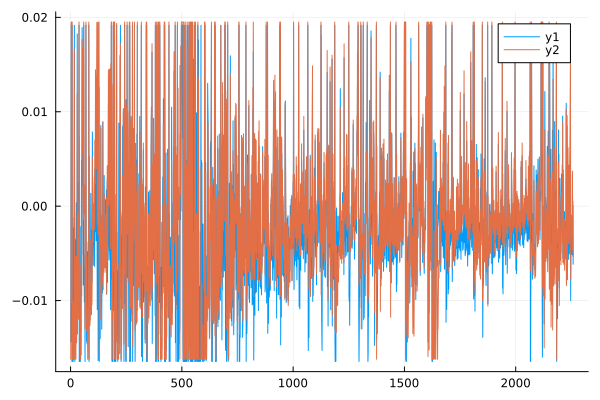

In [35]:
plot([err_all1[2][:,1],err_all1[6][:,1]])

# Pockets

In [9]:
#### SUPER-Short kernel for estimating pockets of indivial stocks 
bw=0.001  # kernel width

0.001

In [ ]:

sm=496;

rawSED_tvar1=vcat(median(hcat([SED_smooth(err_all1[2][:,j],err_all1[5][:,j],bw) for j=1:sm]...), dims=2)...);
rawSED_tvEWD1=vcat(median(hcat([SED_smooth(err_all1[2][:,j],err_all1[6][:,j],bw) for j=1:sm]...), dims=2)...);

# How it looks like for TV-EWD
plot(rawSED_tvEWD)

# POCKETS: Smothed Cross-sec. median of all stocks

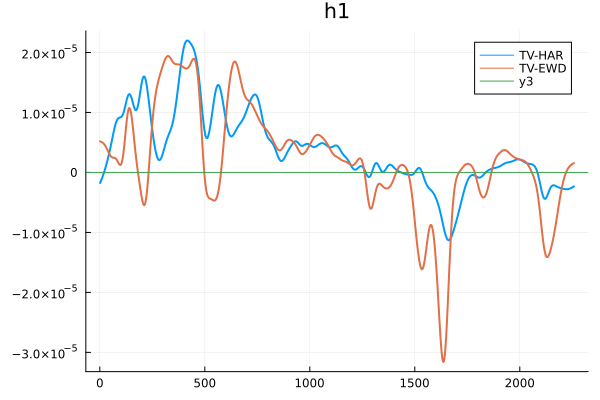

In [35]:
plot([kernel_smooth(rawSED_tvar1, 20.0) kernel_smooth(rawSED_tvEWD1, 20.0)], linewidth=2,title="h1",label=["TV-HAR" "TV-EWD"])
hline!([0])

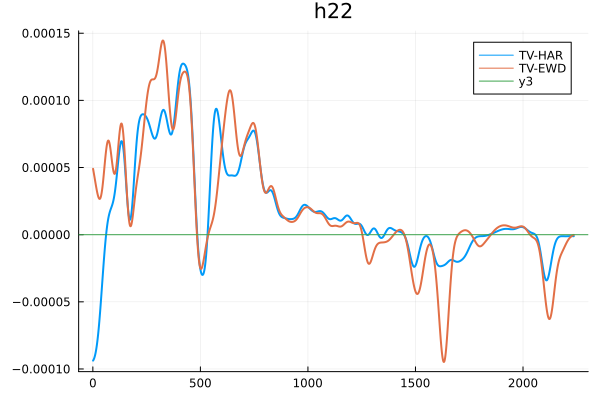

In [38]:
rawSED_tvar22=vcat(median(hcat([SED_smooth(err_all22[2][:,j],err_all22[5][:,j],bw) for j=1:sm]...), dims=2)...);
rawSED_tvEWD22=vcat(median(hcat([SED_smooth(err_all22[2][:,j],err_all22[6][:,j],bw) for j=1:sm]...), dims=2)...);
plot([kernel_smooth(rawSED_tvar22, 20.0) kernel_smooth(rawSED_tvEWD22, 20.0)], linewidth=2,title="h22",label=["TV-HAR" "TV-EWD"])
hline!([0])

In [17]:
bw=0.005

#SED_smooth(err_all1[2][:,stock],err_all1[5][:,stock],bw).>0
hmp1_tvar=hcat([SED_smooth(err_all1[2][:,j],err_all1[5][:,j],bw) for j=1:20]...);
hmp2_tvewd=hcat([SED_smooth(err_all1[2][:,j],err_all1[6][:,j],bw) for j=1:20]...);

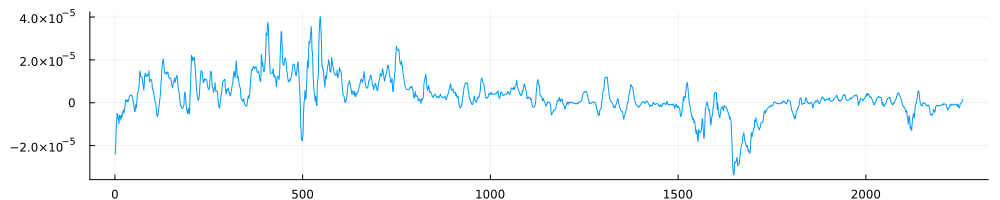

In [37]:
plot(median(hmp1_tvar,dims=2),outliers=false, legend=false,size=(1000,200))

# Pockets for an individual stock

In [9]:
mycolor

In [16]:
# Find intervals of 1s
function find_intervals(vec)
    diff_x = diff([0; vec; 0]) # Add 0 at start and end to detect edges
    starts = findall(x -> x == 1, diff_x) # Find rising edges
    ends = findall(x -> x == -1, diff_x) # Find falling edges
    return zip(starts, ends .- 1)
end

function plot_pockets(err1,err2,bw,tit)
    
    mycolors_pockets=[mycolor[1] mycolor[1] mycolor[3]];
    
    plot(SED_smooth(err1,err2,bw),color=:white,legend=false,
    framestyle = :box,size=(1000,200),title = tit,
    xticks=([100,351,602,848,1095,1343,1593,1844,2091],["2010","2011","2012","2013","2014","2015","2016","2017","2018"])) 
    plot!([[i,j] for (i,j) in find_intervals(SED_smooth(err1,err2,bw).>0.0)] ,fill=mycolor[3], fillalpha=0.3,linecolor=:transparent,seriestype=:vspan,label=false)
    plot!(SED_smooth(err1,err2,bw),color=mycolor[1])
    plot!([0], seriestype="hline",linestyle=:dash,color=mycolor[3])
    plot!(fontfamily="serif-roman",titlefontsize=10, xtickfontsize=10,ytickfontsize=10,ylabelfontsize=10)
end

function plot_pockets_spur(err1,err2,bw,bootthr,tit)
    
    mycolors_pockets=[mycolor[1] mycolor[1] mycolor[3]];
    
    plot(SED_smooth(err1,err2,bw),color=:white,legend=false,
    framestyle = :box,size=(1000,200),title = tit,
    xticks=([100,351,602,848,1095,1343,1593,1844,2091],["2010","2011","2012","2013","2014","2015","2016","2017","2018"])) 
    plot!([[i,j] for (i,j) in find_intervals(SED_smooth(err1,err2,bw).>0.0)] ,fill=mycolor[4], fillalpha=0.2,linecolor=:transparent,seriestype=:vspan,label=false)
    plot!([[i,j] for (i,j) in find_intervals(SED_smooth(err1,err2,bw).>bootthr)] ,fill=mycolor[3], fillalpha=0.3,linecolor=:transparent,seriestype=:vspan,label=false)
    plot!(SED_smooth(err1,err2,bw),color=mycolor[1])
    plot!([0], seriestype="hline",linestyle=:dash,color=mycolor[3])
    plot!(fontfamily="serif-roman",titlefontsize=10, xtickfontsize=10,ytickfontsize=10,ylabelfontsize=10)
end

plot_pockets_spur (generic function with 1 method)

In [12]:
function tvOLS2(x, y, bw,tkernel)

    # Ensure dimensions of x and y match
    obs = size(x, 1)
    if length(y) != obs
        error("Dimensions of 'x' and 'y' are not compatible.")
    end

    nvar = size(x, 2)  # Number of variables (columns of x)
    
    # Initialize containers for results
    theta = zeros(obs, nvar)  # Coefficients
    fitted = zeros(obs)  # Fitted values
    residuals = zeros(obs)  # Residuals
    
    # Calculate the rescaled distances of time points
    grid = collect(1:obs) / obs
    
    # Estimate the local regression coefficients for all periods
    for t in 1:obs

        # Compute the kernel weights for the current time point t
        tau0 = grid .- grid[t]  # Distance from time t to all other points
        kernel_weights = kernel0(tau0, bw, tkernel)
        
        kernel_weights /= sum(kernel_weights)
        
        # Select only the points with non-zero kernel weights
        k_idx = findall(kernel_weights .> 0)

        #if length(k_idx) < 3
        #    error("Bandwidth too small for 'bw'.")
        #end

        # Weighted least squares regression for time t
        x_temp = x[k_idx, :]
        y_temp = y[k_idx]
        w_temp = kernel_weights[k_idx]

        # Perform the weighted OLS
        XW = x_temp .* sqrt.(w_temp)  # Apply square root of weights to X
        yW = y_temp .* sqrt.(w_temp)  # Apply square root of weights to y
        #coef = XW \ yW  # OLS: Solve for coefficients with alternative method
        coef = (XW' * XW) \ (XW' * yW)

        # Store the time-varying coefficients for time t
        theta[t, :] = coef'
        
        # Compute fitted values and residuals
        fitted[t] = dot(x[t, :], coef)
        residuals[t] = y[t] - fitted[t]
    end

    # Return the time-varying coefficients, fitted values, and residuals
    return (coefficients = theta, fitted = fitted, residuals = residuals)
end

function kernel0(t, bw, tkernel)
    z = t / bw
    if tkernel == "Gaussian"
        return exp.(-0.5 * z.^2) / sqrt(2 * pi)
    elseif tkernel == "Epa" || tkernel == "Epanechnikov"
        return max.(0, 0.75 * (1 .- z.^2))
    elseif tkernel == "onesided"
        return (z.>0).*exp.(-0.5 * z.^2)
    else
        error("Unknown kernel type")
    end
end
function SED_smooth_one(s1,s2,band)
    data=s1.^2 .- s2.^2;
    t=[t for t in 1.0:1.0:length(data)]
    result1 = tvOLS2(t, data, band,"onesided")
    return result1.fitted
end


function plot_pockets_spur_one(err1,err2,bw,bootthr,tit)
    
    mycolors_pockets=[mycolor[1] mycolor[1] mycolor[3]];
    
    plot(SED_smooth_one(err1,err2,bw),color=:white,legend=false,
    framestyle = :box,size=(1000,200),title = tit,
    xticks=([100,351,602,848,1095,1343,1593,1844,2091],["2010","2011","2012","2013","2014","2015","2016","2017","2018"])) 
    plot!([[i,j] for (i,j) in find_intervals(SED_smooth_one(err1,err2,bw).>0.0)] ,fill=mycolor[4], fillalpha=0.2,linecolor=:transparent,seriestype=:vspan,label=false)
    plot!([[i,j] for (i,j) in find_intervals(SED_smooth_one(err1,err2,bw).>bootthr)] ,fill=mycolor[3], fillalpha=0.3,linecolor=:transparent,seriestype=:vspan,label=false)
    plot!(SED_smooth_one(err1,err2,bw),color=mycolor[1])
    plot!([0], seriestype="hline",linestyle=:dash,color=mycolor[3])
    plot!(fontfamily="serif-roman",titlefontsize=10, xtickfontsize=10,ytickfontsize=10,ylabelfontsize=10)
end

plot_pockets_spur_one (generic function with 1 method)

In [13]:
[["" "TVAR" "TVHAR" "TVEWD"]
    ["h=1"  0.0003467599642181169 4.011045083750926e-6 1.2019772866130706e-5]
    ["h=5" 3.1122818805228614e-5 1.0934609909422118e-5 2.402437424495225e-6]
    ["h=22" 1.2687044526176084e-5 1.2687044526176084e-5 1.2687044526176084e-5]]

4×4 Matrix{Any}:
 ""       "TVAR"      "TVHAR"     "TVEWD"
 "h=1"   0.00034676  4.01105e-6  1.20198e-5
 "h=5"   3.11228e-5  1.09346e-5  2.40244e-6
 "h=22"  1.2687e-5   1.2687e-5   1.2687e-5

In [14]:
bootthr=[[0.0003467599642181169 4.011045083750926e-6 1.2019772866130706e-5]
    [3.1122818805228614e-5 1.0934609909422118e-5 2.402437424495225e-6]
    [6.82026230827422e-6 5.688913526381037e-6 4.251738505230786e-6]]

3×3 Matrix{Float64}:
 0.00034676  4.01105e-6  1.20198e-5
 3.11228e-5  1.09346e-5  2.40244e-6
 6.82026e-6  5.68891e-6  4.25174e-6

In [18]:
stock=1;

bw=0.01
p1=plot_pockets_spur(err_all1[2][:,stock],err_all1[5][:,stock],bw,bootthr[1,2],"TV-HAR vs. HAR (h=1)")
p2=plot_pockets_spur(err_all1[2][:,stock],err_all1[6][:,stock],bw,bootthr[1,2],"TV-EWD vs. HAR (h=1)")
bw=0.01
p3=plot_pockets_spur(err_all5[2][:,stock],err_all5[5][:,stock],bw,bootthr[2,2],"TV-HAR vs. HAR (h=5)")
p4=plot_pockets_spur(err_all5[2][:,stock],err_all5[6][:,stock],bw,bootthr[2,3],"TV-EWD vs. HAR (h=5)")
bw=0.01
p5=plot_pockets_spur(err_all22[2][:,stock],err_all22[5][:,stock],bw,bootthr[3,2],"TV-HAR vs. HAR (h=22)")
p6=plot_pockets_spur(err_all22[2][:,stock],err_all22[6][:,stock],bw,bootthr[3,3],"TV-EWD vs. HAR (h=22)")

plot(p1,p2,p3,p4,p5,p6, layout = (6,1), legend = false, size = (1000, 900))
plot!(fontfamily="serif-roman",xtickfontsize=10,ytickfontsize=10) 

LoadError: UndefVarError: SED_smooth not defined

In [43]:
mycolor=palette(:Greys_8)

In [44]:
function plot_pockets_spur_one_BW(err1,err2,bw,bootthr,tit)
    
    
    plot(SED_smooth_one(err1,err2,bw),color=:white,legend=false,
    framestyle = :box,size=(1000,200),title = tit,
    xticks=([100,351,602,848,1095,1343,1593,1844,2091],["2010","2011","2012","2013","2014","2015","2016","2017","2018"])) 
    plot!([[i,j] for (i,j) in find_intervals(SED_smooth_one(err1,err2,bw).>0.0)] ,fill=mycolor[4], fillalpha=0.2,linecolor=:transparent,seriestype=:vspan,label=false)
    plot!([[i,j] for (i,j) in find_intervals(SED_smooth_one(err1,err2,bw).>bootthr)] ,fill=mycolor[8], fillalpha=0.2,linecolor=:transparent,seriestype=:vspan,label=false)
    plot!(SED_smooth_one(err1,err2,bw),color=mycolor[8])
    plot!([0], seriestype="hline",linestyle=:dash,color=mycolor[5])
    plot!(fontfamily="serif-roman",titlefontsize=10, xtickfontsize=10,ytickfontsize=10,ylabelfontsize=10)
end

plot_pockets_spur_one_BW (generic function with 1 method)

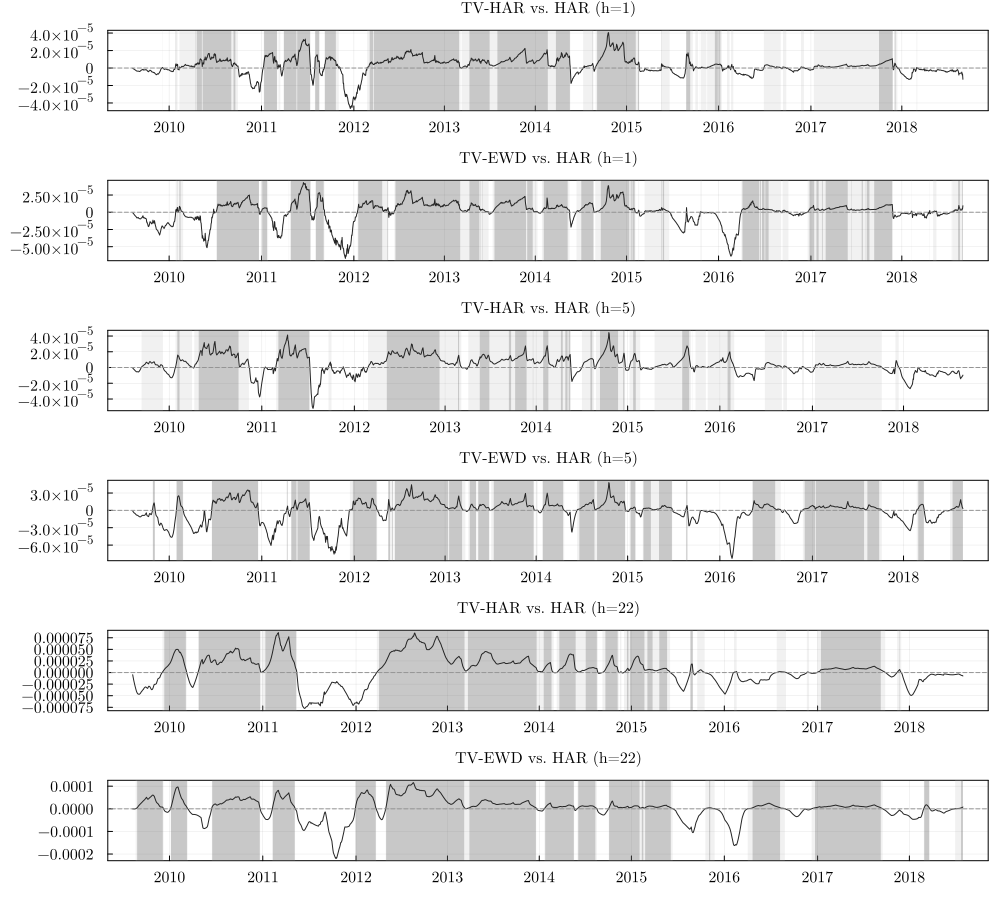

In [45]:
stock=1;

bw=0.01
p1=plot_pockets_spur_one_BW(err_all1[2][:,stock],err_all1[5][:,stock],bw,bootthr[1,2],"TV-HAR vs. HAR (h=1)")
p2=plot_pockets_spur_one_BW(err_all1[2][:,stock],err_all1[6][:,stock],bw,bootthr[1,2],"TV-EWD vs. HAR (h=1)")
bw=0.01
p3=plot_pockets_spur_one_BW(err_all5[2][:,stock],err_all5[5][:,stock],bw,bootthr[2,2],"TV-HAR vs. HAR (h=5)")
p4=plot_pockets_spur_one_BW(err_all5[2][:,stock],err_all5[6][:,stock],bw,bootthr[2,3],"TV-EWD vs. HAR (h=5)")
bw=0.01
p5=plot_pockets_spur_one_BW(err_all22[2][:,stock],err_all22[5][:,stock],bw,bootthr[3,2],"TV-HAR vs. HAR (h=22)")
p6=plot_pockets_spur_one_BW(err_all22[2][:,stock],err_all22[6][:,stock],bw,bootthr[3,3],"TV-EWD vs. HAR (h=22)")

plot(p1,p2,p3,p4,p5,p6, layout = (6,1), legend = false, size = (1000, 900))
plot!(fontfamily="serif-roman",xtickfontsize=10,ytickfontsize=10) 

In [27]:
savefig("pockets_volatility_example.pdf")

"/Users/barunik/Documents/PhD/Papers/2022_Local_Persistence_Lukas/Restat_Revision_LV1/Revision Volatility notebook/pockets_volatility_example.pdf"

In [46]:
using BSON: @save, @load

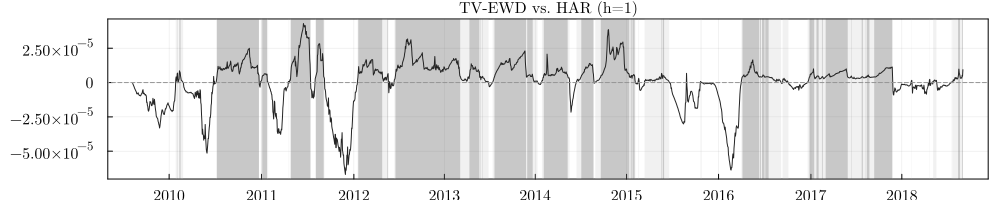

In [48]:
plot_pockets_spur_one_BW(err_all1[2][:,stock],err_all1[6][:,stock],bw,bootthr[1,2],"TV-EWD vs. HAR (h=1)")

In [ ]:
using Pkg
Pkg.add("BSON")
using BSON: @save, @loadusing Pkg
Pkg.add("BSON")
using BSON: @save, @load

In [49]:
forecast=(
    model1=err_all1[2][:,stock],
    model2=err_all1[6][:,stock])

@save "example.bson" forecasts

In [52]:
bw,bootthr[1,2]

(0.01, 4.011045083750926e-6)

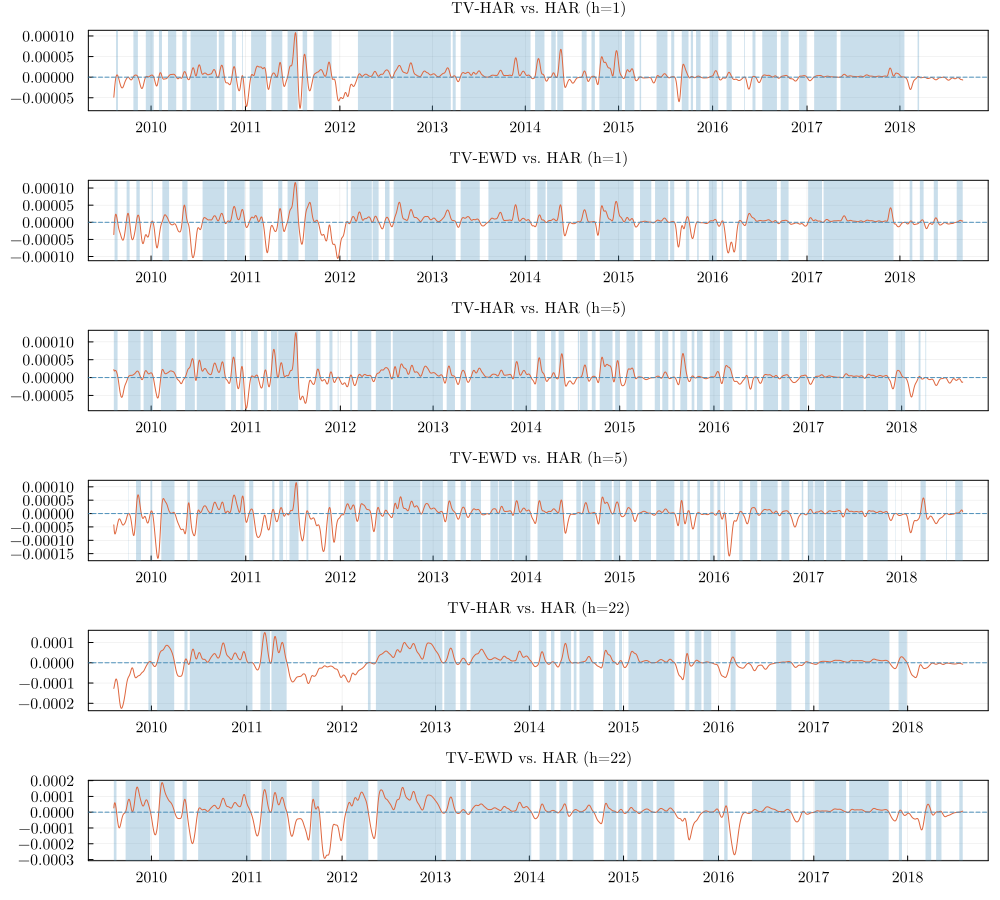

In [33]:
stock=1;

bw=0.005
p1=plot_pockets(err_all1[2][:,stock],err_all1[5][:,stock],bw,"TV-HAR vs. HAR (h=1)")
p2=plot_pockets(err_all1[2][:,stock],err_all1[6][:,stock],bw,"TV-EWD vs. HAR (h=1)")
bw=0.005
p3=plot_pockets(err_all5[2][:,stock],err_all5[5][:,stock],bw,"TV-HAR vs. HAR (h=5)")
p4=plot_pockets(err_all5[2][:,stock],err_all5[6][:,stock],bw,"TV-EWD vs. HAR (h=5)")
bw=0.005
p5=plot_pockets(err_all22[2][:,stock],err_all22[5][:,stock],bw,"TV-HAR vs. HAR (h=22)")
p6=plot_pockets(err_all22[2][:,stock],err_all22[6][:,stock],bw,"TV-EWD vs. HAR (h=22)")

plot(p1,p2,p3,p4,p5,p6, layout = (6,1), legend = false, size = (1000, 900))
plot!(fontfamily="serif-roman",xtickfontsize=10,ytickfontsize=10) 

In [19]:
function gaussian_kernel(x::Float64, x_query::Float64, sigma::Float64)
    dist_sq = (x - x_query)^2
    return exp(-dist_sq / (2 * sigma^2))
end

# Local coefficient of determination (local R²)
function local_metrics(error_bench::Vector{Float64}, error_pred::Vector{Float64}, x_query::Float64, sigma::Float64,loss)
    # Ensure the vectors are of the same length
    n = length(error_pred)
    x_coords = collect(1.0:n)
    
    # Compute weights using the Gaussian kernel
    weights = [gaussian_kernel(x_coords[i], x_query, sigma) for i in 1:n]
    
    # Normalize weights
    weights /= sum(weights)

    # Compute weighted residual sum of squares (RSS) and total sum of squares (TSS)
    #rss = sum(weights .* (error_pred).^2)  # Residual sum of squares
    #tss = sum(weights .* (error_bench).^2)  # Total sum of squares

    if loss == "RMSE"
        rss = sqrt(mean(weights .* (error_pred).^2))  # Residual sum of squares
        tss = sqrt(mean(weights .* (error_bench).^2))  # Total sum of squares
    elseif loss == "MAE"
        rss = mean(abs.(weights .* (error_pred)))  # Residual sum of squares
        tss = mean(abs.(weights .* (error_bench)))  # Total sum of squares
    end
        
    # Compute local MSE
    localmse = rss / tss
    return localmse
end

function OOS_pockets(err_har,err_tvar,err_tvhar,err_tvewd,bandw,bw_sed,loss)

    locR2_tvar=[local_metrics(err_har, err_tvar, j, bandw,loss) for j=1.0:length(err_tvhar)]
    pockets_tvar=SED_smooth(err_har,err_tvar,bw_sed).>0.0
    
    locR2_tvhar=[local_metrics(err_har, err_tvhar, j, bandw,loss) for j=1.0:length(err_tvhar)]
    pockets_tvhar=SED_smooth(err_har,err_tvhar,bw_sed).>0.0

    locR2_tvewd=[local_metrics(err_har, err_tvewd, j, bandw,loss) for j=1.0:length(err_tvewd)]
    pockets_tvewd=SED_smooth(err_har,err_tvewd,bw_sed).>0.0
    
    return [sum(locR2_tvar.*pockets_tvar)./sum(pockets_tvar) sum(locR2_tvhar.*pockets_tvhar)./sum(pockets_tvhar) sum(locR2_tvewd.*pockets_tvewd)./sum(pockets_tvewd)]
end

function OOS_pockets_spurious(err_har,err_tvar,err_tvhar,err_tvewd,bandw,bw_sed,bootthr1,bootthr2,bootthr3,loss)

    locR2_tvar=[local_metrics(err_har, err_tvar, j, bandw,loss) for j=1.0:length(err_tvhar)]
    pockets_tvar=SED_smooth(err_har,err_tvar,bw_sed).>bootthr1
    
    locR2_tvhar=[local_metrics(err_har, err_tvhar, j, bandw,loss) for j=1.0:length(err_tvhar)]
    pockets_tvhar=SED_smooth(err_har,err_tvhar,bw_sed).>bootthr2

    locR2_tvewd=[local_metrics(err_har, err_tvewd, j, bandw,loss) for j=1.0:length(err_tvewd)]
    pockets_tvewd=SED_smooth(err_har,err_tvewd,bw_sed).>bootthr3
    
    return [sum(locR2_tvar.*pockets_tvar)./sum(pockets_tvar) sum(locR2_tvhar.*pockets_tvhar)./sum(pockets_tvhar) sum(locR2_tvewd.*pockets_tvewd)./sum(pockets_tvewd)]
end

OOS_pockets_spurious (generic function with 1 method)

# How much better is MSE using only pockets for indidual stocks ?

In [20]:
bootthr=[[0.0003467599642181169 4.011045083750926e-6 1.2019772866130706e-5]
    [3.1122818805228614e-5 1.0934609909422118e-5 2.402437424495225e-6]
    [4.8143324467630284e-5 3.164509128040154e-5 2.481788564607729e-5]]

3×3 Matrix{Float64}:
 0.00034676  4.01105e-6  1.20198e-5
 3.11228e-5  1.09346e-5  2.40244e-6
 4.81433e-5  3.16451e-5  2.48179e-5

In [ ]:
num=496;
res_pockets1_mse=vcat([OOS_pockets_spurious(err_all1[2][:,stock],err_all1[4][:,stock],err_all1[5][:,stock],err_all1[6][:,stock],5.0,0.03,bootthr[1,3],bootthr[1,2],bootthr[1,3],"RMSE") for stock=1:num]...)
res_pockets5_mse=vcat([OOS_pockets_spurious(err_all5[2][:,stock],err_all5[4][:,stock],err_all5[5][:,stock],err_all5[6][:,stock],10.0,0.03,bootthr[2,3],bootthr[2,2],bootthr[2,3],"RMSE") for stock=1:num]...)
res_pockets22_mse=vcat([OOS_pockets_spurious(err_all22[2][:,stock],err_all22[4][:,stock],err_all22[5][:,stock],err_all22[6][:,stock],10.0,0.03,bootthr[3,1],bootthr[3,2],bootthr[3,3],"RMSE") for stock=1:num]...)

[median(res_pockets1_mse, dims=1);
    median(res_pockets5_mse, dims=1);
    median(res_pockets22_mse, dims=1)];

In [23]:
res_pockets1_mae=vcat([OOS_pockets_spurious(err_all1[2][:,stock],err_all1[4][:,stock],err_all1[5][:,stock],err_all1[6][:,stock],5.0,0.03,bootthr[1,3],bootthr[1,2],bootthr[1,3],"MAE") for stock=1:num]...)
res_pockets5_mae=vcat([OOS_pockets_spurious(err_all5[2][:,stock],err_all5[4][:,stock],err_all5[5][:,stock],err_all5[6][:,stock],10.0,0.03,bootthr[2,3],bootthr[2,2],bootthr[2,3],"MAE") for stock=1:num]...)
res_pockets22_mae=vcat([OOS_pockets_spurious(err_all22[2][:,stock],err_all22[4][:,stock],err_all22[5][:,stock],err_all22[6][:,stock],10.0,0.03,bootthr[3,1],bootthr[3,2],bootthr[3,3],"MAE") for stock=1:num]...)

[median(res_pockets1_mae, dims=1);
    median(res_pockets5_mae, dims=1);
    median(res_pockets22_mae, dims=1)];

In [32]:
output_bson = Dict("h1mse" => res_pockets1_mse,"h2mse" => res_pockets5_mse,"h3mse" => res_pockets22_mse,
"h1mae" => res_pockets1_mae,"h2mae" => res_pockets5_mae,"h3mae" => res_pockets22_mae)
BSON.bson("pockets_results_vol.bson",output_bson)

In [41]:
round.([median(res_pockets1_mse.*(isnan.(res_pockets1_mse).==0), dims=1);
    median(res_pockets5_mse.*(isnan.(res_pockets5_mse).==0), dims=1);
    median(res_pockets22_mse.*(isnan.(res_pockets22_mse).==0), dims=1);
    median(res_pockets1_mae.*(isnan.(res_pockets1_mae).==0), dims=1);
    median(res_pockets5_mae.*(isnan.(res_pockets5_mae).==0), dims=1);
    median(res_pockets22_mae.*(isnan.(res_pockets22_mae).==0), dims=1)]',digits=3)

3×6 Matrix{Float64}:
 0.837  0.817  0.508  0.839  0.778  0.491
 0.873  0.76   0.557  0.832  0.715  0.536
 0.796  0.758  0.506  0.73   0.688  0.489

In [21]:
num=496;
res_pockets1_mse=vcat([OOS_pockets(err_all1[2][:,stock],err_all1[4][:,stock],err_all1[5][:,stock],err_all1[6][:,stock],5.0,0.03,"RMSE") for stock=1:num]...)
res_pockets5_mse=vcat([OOS_pockets(err_all5[2][:,stock],err_all5[4][:,stock],err_all5[5][:,stock],err_all5[6][:,stock],10.0,0.03,"RMSE") for stock=1:num]...)
res_pockets22_mse=vcat([OOS_pockets(err_all22[2][:,stock],err_all22[4][:,stock],err_all22[5][:,stock],err_all22[6][:,stock],10.0,0.03,"RMSE") for stock=1:num]...)

[median(res_pockets1_mse, dims=1);
    median(res_pockets5_mse, dims=1);
    median(res_pockets22_mse, dims=1)]

3×3 Matrix{Float64}:
 0.915351  0.903146  0.874664
 0.840548  0.833975  0.78524
 0.664148  0.67625   0.611475

In [22]:
res_pockets1_mae=vcat([OOS_pockets(err_all1[2][:,stock],err_all1[4][:,stock],err_all1[5][:,stock],err_all1[6][:,stock],5.0,0.03,"MAE") for stock=1:num]...)
res_pockets5_mae=vcat([OOS_pockets(err_all5[2][:,stock],err_all5[4][:,stock],err_all5[5][:,stock],err_all5[6][:,stock],10.0,0.03,"MAE") for stock=1:num]...)
res_pockets22_mae=vcat([OOS_pockets(err_all22[2][:,stock],err_all22[4][:,stock],err_all22[5][:,stock],err_all22[6][:,stock],10.0,0.03,"MAE") for stock=1:num]...)

[median(res_pockets1_mae, dims=1);
    median(res_pockets5_mae, dims=1);
    median(res_pockets22_mae, dims=1)]

3×3 Matrix{Float64}:
 0.87684   0.866621  0.815159
 0.802152  0.796396  0.719099
 0.666335  0.666196  0.605663

In [23]:
round.([median(res_pockets1_mse, dims=1);
    median(res_pockets5_mse, dims=1);
    median(res_pockets22_mse, dims=1);
    median(res_pockets1_mae, dims=1);
    median(res_pockets5_mae, dims=1);
    median(res_pockets22_mae, dims=1)]',digits=3)

3×6 Matrix{Float64}:
 0.915  0.841  0.664  0.877  0.802  0.666
 0.903  0.834  0.676  0.867  0.796  0.666
 0.875  0.785  0.611  0.815  0.719  0.606

In [27]:
lev1=0.05
lev5=0.05
lev22=0.05

(results1_1,results5_1,results22_1) = get_loss2(res1all,res5all,res22all,sel,"RMSE",lev1,lev5,lev22,7);
(results1_2,results5_2,results22_2) = get_loss2(res1all,res5all,res22all,sel,"MAE",lev1,lev5,lev22,7);

# (results1_1,results5_1,results22_1) = get_loss(res1,res5,res22,sel,"RMSE",lev1,lev5,lev22);
# (results1_2,results5_2,results22_2) = get_loss(res1,res5,res22,sel,"MAE",lev1,lev5,lev22);
#(results1_3,results5_3,results22_3) = get_loss(res1,res5,res22,sel,"MAE-LOG",lev1,lev5,lev22);
#(results1_4,results5_4,results22_4) = get_loss(res1,res5,res22,sel,"QLIKE",lev1,lev5,lev22);
#(results1_MZa,results5_MZa,results22_MZa) = get_loss(res1,res5,res22,sel,"MZa",lev1,lev5,lev22);
#(results1_MZb,results5_MZb,results22_MZb) = get_loss(res1,res5,res22,sel,"MZb",lev1,lev5,lev22);
#(results1_MZR2,results5_MZR2,results22_MZR2) = get_loss(res1,res5,res22,sel,"MZR2",lev1,lev5,lev22);
#(results1_MZR2ratio,results5_MZR2ratio,results22_MZR2ratio) = get_loss(res1,res5,res22,sel,"MZR2ratio",lev1,lev5,lev22);

for k=1:3

    println("##########################################################################")
    println("  Time period   ",sel[1,k],"  -  ",sel[2,k],"       Dates:     ",datpos[sel[1,k]]," : ",datpos[sel[2,k]])
    println("##########################################################################")

    println("####################### RMSE ####################### ####################### MAE #######################")
    display([[["" "h=1" "h=5" "h=22"];[names[Not(1)] round.(median(results1_1[k],dims=2),digits=3) round.(median(results5_1[k],dims=2),digits=3) round.(median(results22_1[k],dims=2),digits=3)]] [["h=1" "h=5" "h=22"];[round.(median(results1_2[k],dims=2),digits=3) round.(median(results5_2[k],dims=2),digits=3) round.(median(results22_2[k],dims=2),digits=3)]]])
    #println("####################### MAE #######################")
    #display([["" "h=1" "h=5" "h=22"];[names[Not(1)] median(results1_2[k],dims=2) median(results5_2[k],dims=2) median(results22_2[k],dims=2)]])
    #println("####################### MAE-LOG #######################")
    #display([["" "h=1" "h=5" "h=22"];[names[Not(1)] median(results1_3[k],dims=2) median(results5_3[k],dims=2) median(results22_3[k],dims=2)]])
    #println("####################### QLIKE #######################")
    #display([["" "h=1" "h=5" "h=22"];[names[Not(1)] median(results1_4[k],dims=2) median(results5_4[k],dims=2) median(results22_4[k],dims=2)]])
    #println("####################### MZ R2 ratio #######################")
    #display([["" "h=1" "h=5" "h=22"];[names[Not(1)] median(results1_MZR2ratio[k],dims=2) median(results5_MZR2ratio[k],dims=2) median(results22_MZR2ratio[k],dims=2)]])
    #println("####################### MZ h=1 #######################")
    #display([["" "a" "b" "R^2"]; [names[:] median(results1_MZa[k],dims=2) median(results1_MZb[k],dims=2) median(results1_MZR2[k],dims=2)]])
    #println("####################### MZ h=5 #######################")
    #display([["" "a" "b" "R^2"]; [names[:] median(results5_MZa[k],dims=2) median(results5_MZb[k],dims=2) median(results5_MZR2[k],dims=2)]])
    #println("####################### MZ h=22 #######################")
    #display([["" "a" "b" "R^2"]; [names[:] median(results22_MZa[k],dims=2) median(results22_MZb[k],dims=2) median(results22_MZR2[k],dims=2)]])

end

##########################################################################
  Time period   1  -  2258       Dates:     2009-08-10 : 2018-08-31
##########################################################################
####################### RMSE ####################### ####################### MAE #######################


6×7 Matrix{Any}:
 ""         "h=1"   "h=5"   "h=22"   "h=1"   "h=5"   "h=22"
 "HAR"     1.003   0.954   1.043    1.096   1.041   1.114
 "EWD"     1.059   0.961   0.993    1.089   0.966   0.978
 "TV-AR3"  1.031   1.052   1.001    1.103   1.11    0.999
 "TV-HAR"  0.952   0.891   0.858    1.009   0.93    0.867
 "TV-EWD"  0.966   0.913   0.861    1.005   0.93    0.848

##########################################################################
  Time period   1  -  751       Dates:     2009-08-10 : 2012-08-08
##########################################################################
####################### RMSE ####################### ####################### MAE #######################


6×7 Matrix{Any}:
 ""         "h=1"   "h=5"   "h=22"   "h=1"   "h=5"   "h=22"
 "HAR"     1.049   1.019   1.184    1.149   1.132   1.394
 "EWD"     1.095   0.999   1.161    1.132   1.011   1.179
 "TV-AR3"  1.109   1.243   1.259    1.204   1.331   1.338
 "TV-HAR"  0.955   0.902   0.99     1.012   0.955   1.033
 "TV-EWD"  0.959   0.902   0.891    0.992   0.915   0.886

##########################################################################
  Time period   1751  -  2001       Dates:     2016-08-18 : 2017-08-22
##########################################################################
####################### RMSE ####################### ####################### MAE #######################


6×7 Matrix{Any}:
 ""         "h=1"   "h=5"   "h=22"   "h=1"   "h=5"   "h=22"
 "HAR"     0.971   0.879   0.801    1.073   0.961   0.831
 "EWD"     0.981   0.893   0.797    1.021   0.897   0.796
 "TV-AR3"  0.983   0.924   0.808    1.08    1.022   0.852
 "TV-HAR"  0.921   0.818   0.741    0.994   0.863   0.761
 "TV-EWD"  0.923   0.845   0.744    0.963   0.835   0.73

## Boxplots

In [30]:
mycolor=[colorant"rgb(222,102,62)",colorant"rgb(255,145,43)",colorant"rgb(76,144,186)",colorant"rgb(43,194,194)",colorant"rgb(244,184,17)"]
mycolor=palette(:Greys_8)

In [80]:
function multiple_boxplot_pockets_BW(dat1,dat5,dat22,dat1pockets,y1,y2,ylab,legendlab)

    h1=DataFrame([vec(dat1) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat1')[2])) repeat([1], length(vec(dat1')))], ["ratio", "model", "horz"])
    h5=DataFrame([vec(dat5) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat5')[2])) repeat([5], length(vec(dat5')))], ["ratio", "model", "horz"])
    h22=DataFrame([vec(dat22) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat22')[2])) repeat([22], length(vec(dat22')))], ["ratio", "model", "horz"])

    h1pockets=DataFrame([vec(dat1pockets) vec(repeat(["TV-AR" "TV-HAR" "TV-EWD"], size(dat1pockets')[2])) repeat([23], length(vec(dat1pockets')))], ["ratio", "model", "horz"])

    df = [h1; h5; h22; h1pockets]

    h10=DataFrame([vec(repeat(median(dat1,dims=1), size(dat1')[2])) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat1')[2])) repeat([1], length(vec(dat1')))], ["medians", "model", "horz"])
    h50=DataFrame([vec(repeat(median(dat5,dims=1), size(dat5')[2])) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat5')[2])) repeat([5], length(vec(dat5')))], ["medians", "model", "horz"])
    h220=DataFrame([vec(repeat(median(dat22,dims=1), size(dat22')[2])) vec(repeat(["EWD" "TV-AR" "TV-HAR" "TV-EWD"], size(dat22')[2])) repeat([22], length(vec(dat22')))], ["medians", "model", "horz"])

    h10pockets=DataFrame([vec(repeat(median(dat1pockets,dims=1), size(dat1pockets')[2])) vec(repeat(["TV-AR" "TV-HAR" "TV-EWD"], size(dat1pockets')[2])) repeat([23], length(vec(dat1pockets')))], ["medians", "model", "horz"])

    df1 = [h10; h50; h220;h10pockets]
    
    mycolors=[mycolor[6] mycolor[3] mycolor[4] mycolor[8]];

    p=groupeddotplot(df.model, df.ratio, group = df.horz, label="", bar_width=0.6,markershape=:circle,markersize=1.4,markeralpha=0.3,
            markercolor=mycolors,markerstrokecolor=:white,framestyle=:box,ylim=[y1,y2],size=(250,400),title=ylab)
    p=groupedboxplot!(df.model, df.ratio, group = df.horz, label=legendlab,linecolor=mycolors,color=mycolors, fillalpha=0.7,
        bar_width=0.6,outliers=false,whisker_width=0.2,linewidth=0.5,linealpha = 0.3)
    p=groupedboxplot!(df1.model, df1.medians, group = df1.horz, bar_width=0.6,linecolor=:White,color=:black,linewidth=2,label="",)
    p=hline!(p,[1],label="",color=:black)
    p=plot!(fontfamily="serif-roman",titlefontsize=10, xtickfontsize=10,ytickfontsize=10,ylabelfontsize=10) 
    return p
end

multiple_boxplot_pockets_BW (generic function with 1 method)

In [82]:
# RMSE, MAE, QLIKE (4 models against benchmark), MZa, MZb,MZR2 aer all 5 models

lev1=0.05
lev5=0.05
lev22=0.05

(results1,results5,results22) = get_loss(res1,res5,res22,sel,"RMSE",lev1,lev5,lev22);

a=multiple_boxplot_pockets_BW(results1[1]',results1[2]',results1[3]',res_pockets1_mse.*(isnan.(res_pockets1_mse).==0),0.4,1.6,"h=1",["Aug 2009 - Aug 2018" "Aug 2009 - Aug 2012" "Aug 2016 - Aug 2017" "Pockets"])
b=multiple_boxplot_pockets_BW(results5[1]',results5[2]',results5[3]',res_pockets5_mse.*(isnan.(res_pockets5_mse).==0),0.4,1.6,"h=5",["Aug 2009 - Aug 2018" "Aug 2009 - Aug 2012" "Aug 2016 - Aug 2017" "Pockets"])
c=multiple_boxplot_pockets_BW(results22[1]',results22[2]',results22[3]',res_pockets22_mse.*(isnan.(res_pockets22_mse).==0),0.4,1.6,"h=22",["Aug 2009 - Aug 2018" "Aug 2009 - Aug 2012" "Aug 2016 - Aug 2017" "Pockets"])
plot(a,b,c,layout=(1,3),size=(1000,400),topmargin=3mm)
plot!(fontfamily="serif-roman",titlefontsize=10, xtickfontsize=10,ytickfontsize=10,ylabelfontsize=10) 

In [83]:
savefig("pockets_volatility_boxplots_mse.pdf")

"/Users/barunik/Documents/PhD/Papers/2022_Local_Persistence_Lukas/Restat_Revision_LV1/Revision Volatility notebook/pockets_volatility_boxplots_mse.pdf"

In [86]:
# RMSE, MAE, QLIKE (4 models against benchmark), MZa, MZb,MZR2 aer all 5 models

lev1=0.05
lev5=0.05
lev22=0.05

(results1,results5,results22) = get_loss(res1,res5,res22,sel,"MAE",lev1,lev5,lev22);

a=multiple_boxplot_pockets_BW(results1[1]',results1[2]',results1[3]',res_pockets1_mae.*(isnan.(res_pockets1_mae).==0),0.4,1.6,"h=1",["Aug 2009 - Aug 2018" "Aug 2009 - Aug 2012" "Aug 2016 - Aug 2017" "Pockets"])
b=multiple_boxplot_pockets_BW(results5[1]',results5[2]',results5[3]',res_pockets5_mae.*(isnan.(res_pockets5_mae).==0),0.4,1.6,"h=5",["Aug 2009 - Aug 2018" "Aug 2009 - Aug 2012" "Aug 2016 - Aug 2017" "Pockets"])
c=multiple_boxplot_pockets_BW(results22[1]',results22[2]',results22[3]',res_pockets22_mae.*(isnan.(res_pockets22_mae).==0),0.4,1.6,"h=22",["Aug 2009 - Aug 2018" "Aug 2009 - Aug 2012" "Aug 2016 - Aug 2017" "Pockets"])
plot(a,b,c,layout=(1,3),size=(1000,400),topmargin=3mm)
plot!(fontfamily="serif-roman",titlefontsize=10, xtickfontsize=10,ytickfontsize=10,ylabelfontsize=10) 

In [87]:
savefig("pockets_volatility_boxplots_mae.pdf")

"/Users/barunik/Documents/PhD/Papers/2022_Local_Persistence_Lukas/Restat_Revision_LV1/Revision Volatility notebook/pockets_volatility_boxplots_mae.pdf"